## Task 3: Global Temperature Changes for 1pctCO2

Goal is to preprocess the global temperature data for 1pctCO2. This model shows the scenario of which CO2 concentration increases by 1% each year. In this process, we don't have to look at any models except for 1pctCO2.

In [115]:
#imports
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
from scipy import stats
import numpy as np
import pandas as pd
import xarray as xr
import zarr
import gcsfs
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [4]:
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
df.head()

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
0,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,ps,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
1,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rsds,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
2,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rlus,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
3,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rlds,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
4,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,psl,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706


In [5]:
def load_zarr_dset(df):
  # get the path to a specific zarr store (the first one from the dataframe above)
  zstore = df.zstore.values[-1]

  # create a mutable-mapping-style interface to the store
  mapper = gcs.get_mapper(zstore)

  # open it using xarray and zarr
  ds = xr.open_zarr(mapper, consolidated=True)
  return ds

In [6]:
gcs = gcsfs.GCSFileSystem(token='anon')

In [53]:
#time index to assign model times to
new_time_index=pd.date_range('1850-01-01', '1999-12-31', freq='ME')
new_time_index

DatetimeIndex(['1850-01-31', '1850-02-28', '1850-03-31', '1850-04-30',
               '1850-05-31', '1850-06-30', '1850-07-31', '1850-08-31',
               '1850-09-30', '1850-10-31',
               ...
               '1999-03-31', '1999-04-30', '1999-05-31', '1999-06-30',
               '1999-07-31', '1999-08-31', '1999-09-30', '1999-10-31',
               '1999-11-30', '1999-12-31'],
              dtype='datetime64[ns]', length=1800, freq='ME')

In [8]:
#query tas models that are for 1pctCO2
df_tas_1pctCO2 = df.query ("activity_id == 'CMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
models_tas_1pctCO2 = set(df_tas_1pctCO2['source_id'])
source_list = list(models_tas_1pctCO2)
print(len(source_list))

59


In [11]:
df_tas_1pctCO2 = df.query ("activity_id == 'CMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2' & member_id == 'r1i1p1f1'")
models_tas_1pctCO2 = set(df_tas_1pctCO2['source_id'])
source_list = list(models_tas_1pctCO2)
print(len(source_list))

50


In [12]:
source_list

['KIOST-ESM',
 'FIO-ESM-2-0',
 'CMCC-CM2-SR5',
 'EC-Earth3-CC',
 'GFDL-ESM4',
 'FGOALS-g3',
 'EC-Earth3-Veg',
 'FGOALS-f3-L',
 'NorESM2-LM',
 'IPSL-CM6A-LR',
 'GISS-E2-2-H',
 'INM-CM5-0',
 'MPI-ESM-1-2-HAM',
 'INM-CM4-8',
 'AWI-CM-1-1-MR',
 'CAS-ESM2-0',
 'GISS-E2-1-H',
 'GFDL-CM4',
 'GISS-E2-2-G',
 'BCC-CSM2-MR',
 'MPI-ESM1-2-HR',
 'ACCESS-ESM1-5',
 'MCM-UA-1-0',
 'ICON-ESM-LR',
 'CESM2-WACCM-FV2',
 'IPSL-CM5A2-INCA',
 'MRI-ESM2-0',
 'NorESM2-MM',
 'BCC-ESM1',
 'KACE-1-0-G',
 'E3SM-1-0',
 'MPI-ESM1-2-LR',
 'IITM-ESM',
 'NorCPM1',
 'CIESM',
 'ACCESS-CM2',
 'CESM2-FV2',
 'CMCC-ESM2',
 'CESM2-WACCM',
 'EC-Earth3-AerChem',
 'AWI-ESM-1-1-LR',
 'CMCC-CM2-HR4',
 'TaiESM1',
 'SAM0-UNICON',
 'NESM3',
 'GISS-E2-1-G',
 'MIROC6',
 'CanESM5',
 'CESM2',
 'CAMS-CSM1-0']

### 1.1 Loading One Model 

In [14]:
#access data
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'FGOALS-g3' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2' & member_id == 'r1i1p1f1'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2)
#load temperature data
tas_1pct_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.tas
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(tas_1pct_fgoalsg3.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_tas_1pctCO2_fgoalsg3_w_mean = tas_1pct_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon', 'lat'))
ds_tas_1pctCO2_fgoalsg3_w_mean

<xarray.DataArray 'tas' (time: 1812)>
dask.array<truediv, shape=(1812,), dtype=float64, chunksize=(677,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 1850-01-17 12:00:00 ... 2000-12-17 12:00:00

Text(0.5, 1.0, 'FGOALS-g3 Global Mean Temperature')

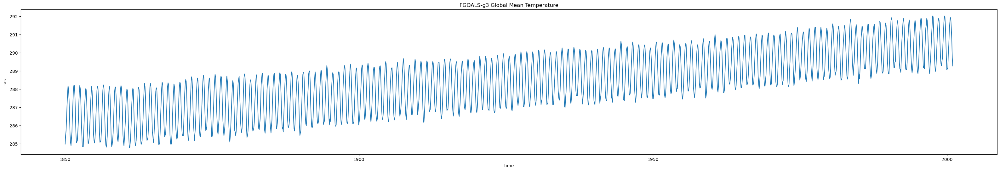

In [15]:
fig, ax = plt.subplots(figsize = (40,6))
ds_tas_1pctCO2_fgoalsg3_w_mean.plot(ax=ax)
plt.title("FGOALS-g3 Global Mean Temperature")

### Adding in 9 Models

In [79]:
ds_9_models_list = list()
#query to individual model
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'CanESM5-CanOE' & member_id == 'r1i1p2f1' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
#slice first and then assign
tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=ds_tas_1pctCO2_fgoalsg3.source_id)           
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))
#add to list
ds_9_models_list.append(ds_all)
print(ds_all.coords)

Coordinates:
    height   float64 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
    model    <U13 'CanESM5-CanOE'


In [80]:
#query to individual model
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'UKESM1-0-LL' & member_id == 'r1i1p1f2' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
#slice first and then assign
#print(ds_tas_1pctCO2_fgoalsg3.time[0])
#print(ds_tas_1pctCO2_fgoalsg3.time[-1])
tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=ds_tas_1pctCO2_fgoalsg3.source_id)           
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))
#add to list
ds_9_models_list.append(ds_all)
print(ds_all.coords)

Coordinates:
    height   float64 1.5
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
    model    <U11 'UKESM1-0-LL'


In [81]:
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'CNRM-CM6-1' & member_id == 'r1i1p1f2' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
#slice first and then assign
#print(ds_tas_1pctCO2_fgoalsg3.time[0])
#print(ds_tas_1pctCO2_fgoalsg3.time[-1])
tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=ds_tas_1pctCO2_fgoalsg3.source_id)           
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))
#add to list
ds_9_models_list.append(ds_all)
print(ds_all.coords)

Coordinates:
    height   float64 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
    model    <U10 'CNRM-CM6-1'


In [82]:
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'MIROC-ES2L' & member_id == 'r1i1p1f2' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
#slice first and then assign
#print(ds_tas_1pctCO2_fgoalsg3.time[0])
#print(ds_tas_1pctCO2_fgoalsg3.time[-1])
tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=ds_tas_1pctCO2_fgoalsg3.source_id)           
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))
#add to list
ds_9_models_list.append(ds_all)
print(ds_all.coords)

Coordinates:
    height   float64 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
    model    <U10 'MIROC-ES2L'


In [83]:
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'CNRM-CM6-1-HR' & member_id == 'r1i1p1f2' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
#slice first and then assign
#print(ds_tas_1pctCO2_fgoalsg3.time[0])
#print(ds_tas_1pctCO2_fgoalsg3.time[-1])
tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=ds_tas_1pctCO2_fgoalsg3.source_id)           
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))
#add to list
ds_9_models_list.append(ds_all)
print(ds_all.coords)

Coordinates:
    height   float64 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
    model    <U13 'CNRM-CM6-1-HR'


In [84]:
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'HadGEM3-GC31-LL' & member_id == 'r1i1p1f3' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
#slice first and then assign
#print(ds_tas_1pctCO2_fgoalsg3.time[0])
#print(ds_tas_1pctCO2_fgoalsg3.time[-1])
tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=ds_tas_1pctCO2_fgoalsg3.source_id)           
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))
#add to list
ds_9_models_list.append(ds_all)
print(ds_all.coords)

Coordinates:
    height   float64 1.5
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
    model    <U15 'HadGEM3-GC31-LL'


In [85]:
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'EC-Earth3' & member_id == 'r3i1p1f1' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
#slice first and then assign
#print(ds_tas_1pctCO2_fgoalsg3.time[0])
#print(ds_tas_1pctCO2_fgoalsg3.time[-1])
tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=ds_tas_1pctCO2_fgoalsg3.source_id)           
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))
#add to list
ds_9_models_list.append(ds_all)
print(ds_all.coords)

Coordinates:
    height   float64 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
    model    <U9 'EC-Earth3'


In [86]:
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'CNRM-ESM2-1' & member_id == 'r1i1p1f2' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
#slice first and then assign
#print(ds_tas_1pctCO2_fgoalsg3.time[0])
#print(ds_tas_1pctCO2_fgoalsg3.time[-1])
tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=ds_tas_1pctCO2_fgoalsg3.source_id)           
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))
#add to list
ds_9_models_list.append(ds_all)

In [87]:
df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'HadGEM3-GC31-MM' & member_id == 'r1i1p1f3' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2'")
ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
#slice first and then assign
#print(ds_tas_1pctCO2_fgoalsg3.time[0])
#print(ds_tas_1pctCO2_fgoalsg3.time[-1])
tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1812))
ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=ds_tas_1pctCO2_fgoalsg3.source_id)           
#weights of the area of the grid cells
weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
#mean of weighted tas_1_pct_fgoalsg3
ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))
#add to list
ds_9_models_list.append(ds_all)

In [88]:
ds_9_models = xr.concat(ds_9_models_list, dim = 'model', coords = 'minimal',compat='override')
ds_9_models

<xarray.Dataset>
Dimensions:  (time: 1800, model: 9)
Coordinates:
    height   float64 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
  * model    (model) <U15 'CanESM5-CanOE' 'UKESM1-0-LL' ... 'HadGEM3-GC31-MM'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 96), meta=np.ndarray>

### 1.2 Load Multiple Models


In [89]:
gcm_list = ['FIO-ESM-2-0',
 'NorESM2-MM',
 'GFDL-CM4',
 'KIOST-ESM',
 'BCC-CSM2-MR']

In [94]:
ds_list = list()
for source in gcm_list:
    df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'FGOALS-g3' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2' & member_id == 'r1i1p1f1'")
    ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2)
    #slice first and then assign
    tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
    ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
    ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=source)           
    #weights of the area of the grid cells
    weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
    #mean of weighted tas_1_pct_fgoalsg3
    ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))

    #add to list
    ds_list.append(ds_all)
ob_all_gcm = xr.concat(ds_list, dim = 'model', coords = 'minimal', compat = 'override')
ob_all_gcm

<xarray.Dataset>
Dimensions:  (time: 1800, model: 5)
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
  * model    (model) <U11 'FIO-ESM-2-0' 'NorESM2-MM' ... 'BCC-CSM2-MR'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 677), meta=np.ndarray>

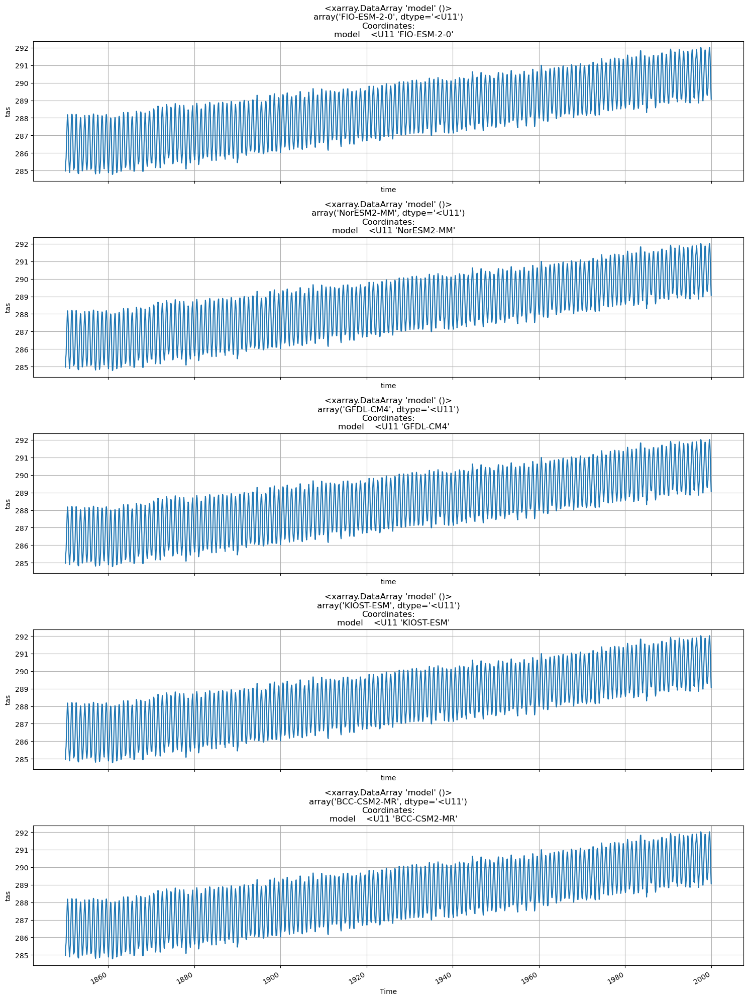

In [95]:
fig, axs = plt.subplots(5, 1, figsize=(15, 20), sharex=True)
for i, model in enumerate(ob_all_gcm.model): #enumerate returns iterator of pairs, each pair contains the index and the corresponding element from the iterable
    ob_all_gcm.sel(model=model).tas.plot(ax=axs[i], label=model) #selects each model and the tas variable, plots over each axes
    axs[i].set_title(model) #shows what model number
    axs[i].set_ylabel('tas')
    axs[i].grid(True) #makes gridlines on plot
axs[-1].set_xlabel('Time') 
plt.tight_layout() #creates a better layout for subplots
plt.show()

In [92]:
ds_list = list()
for source in source_list:
    df_tas_1pctCO2_fgoalsg3 = df.query("activity_id == 'CMIP' & source_id == 'FGOALS-g3' & table_id == 'Amon' & variable_id == 'tas' & experiment_id == '1pctCO2' & member_id == 'r1i1p1f1'")
    ds_tas_1pctCO2_fgoalsg3 = load_zarr_dset(df_tas_1pctCO2_fgoalsg3)
    #checking time periods
    #print("\n" + source)
    #print("\n" + str(ds_tas_1pctCO2_fgoalsg3.time[0]))
    #print("\n" + str(ds_tas_1pctCO2_fgoalsg3.time[-1]))
    #slice first and then assign
    tas_fgoalsg3 = ds_tas_1pctCO2_fgoalsg3.isel(time = slice(0,1800))
    ds_fgoalsg3 = tas_fgoalsg3.assign(time=new_time_index)
    ds_fgoalsg3 = ds_fgoalsg3.assign_coords(model=source)           
    #weights of the area of the grid cells
    weight_fgoalsg3 = np.cos(np.deg2rad(ds_tas_1pctCO2_fgoalsg3.tas.lat))
    #mean of weighted tas_1_pct_fgoalsg3
    ds_all = ds_fgoalsg3.weighted(weight_fgoalsg3).mean(dim=('lon','lat'))

    #add to list
    ds_list.append(ds_all)
ob_all = xr.concat(ds_list, dim = 'model', coords = 'minimal', compat = 'override')
ob_all

<xarray.Dataset>
Dimensions:  (time: 1800, model: 50)
Coordinates:
    height   float64 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
  * model    (model) <U17 'KIOST-ESM' 'FIO-ESM-2-0' ... 'CESM2' 'CAMS-CSM1-0'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 865), meta=np.ndarray>

In [96]:
ds_all_59 = xr.concat([ds_9_models, ob_all], dim = 'model', coords = 'minimal', compat = 'override')
ds_all_59 = ds_all_59.drop_vars('height')
ds_all_59

<xarray.Dataset>
Dimensions:  (time: 1800, model: 59)
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
  * model    (model) <U17 'CanESM5-CanOE' 'UKESM1-0-LL' ... 'CAMS-CSM1-0'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 96), meta=np.ndarray>

### Plots for Multiple Models

In [98]:
#general fn for makes these subplots
def plot_time_series(fig_counter_input, num_subplots, model_index, dataset):
    fig, axs = plt.subplots(num_subplots, 1, figsize=(15, 20), sharex=True)
    fig_counter = fig_counter_input
    while fig_counter < (fig_counter_input + num_subplots): #made another while loop to separate the graphs and make it cleaner
        for i, model in enumerate(dataset.model[model_index:]): #sliced from 30th index after last model figure shown in previous cell block (index should be same each time in dataset)
            if fig_counter >= (fig_counter_input + num_subplots):
                break
            dataset.sel(model=model).tas.plot(ax=axs[i],label=model)
            axs[i].set_title(model) #shows what model number
            axs[i].set_ylabel('tas')
            axs[i].grid(True) #makes gridlines on plot
            fig_counter +=1
    axs[-1].set_xlabel('Time') 
    plt.tight_layout() #creates a better layout for subplots
    plt.show()

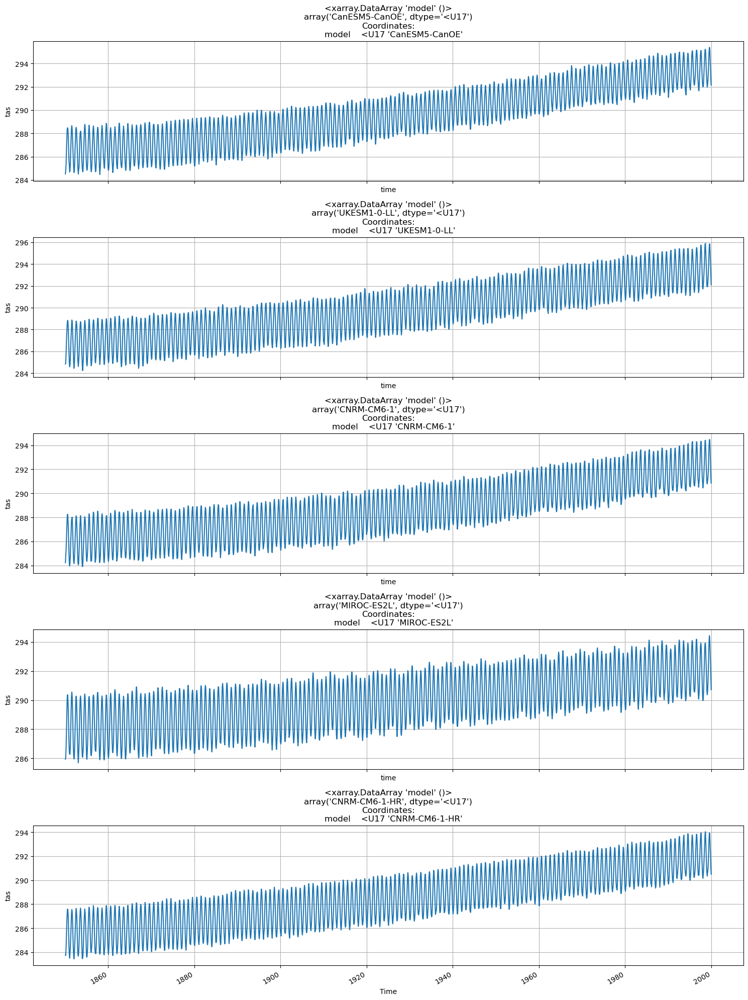

In [99]:
plot_time_series(0,5,0,ds_all_59)

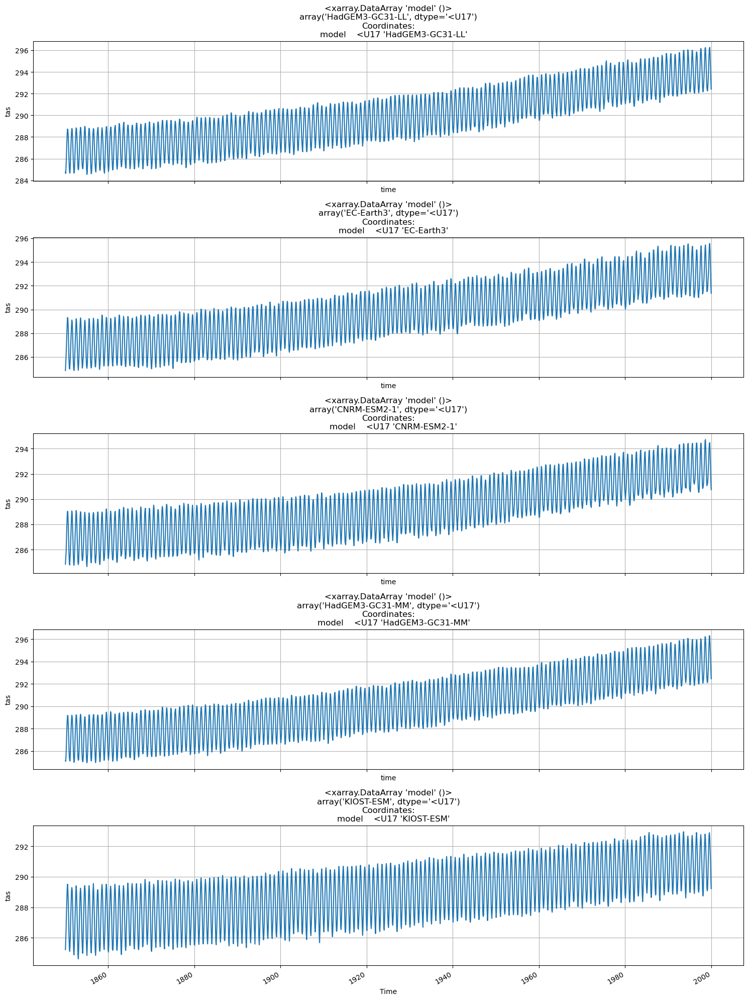

In [100]:
plot_time_series(0,5,5,ds_all_59)

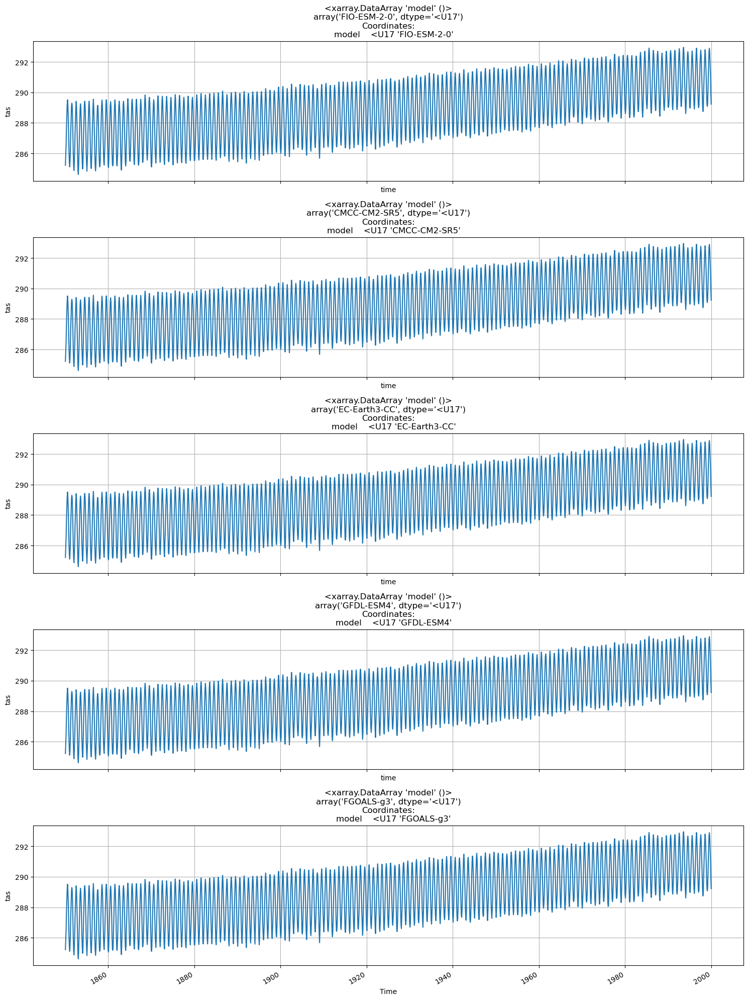

In [101]:
plot_time_series(0,5,10,ds_all_59)

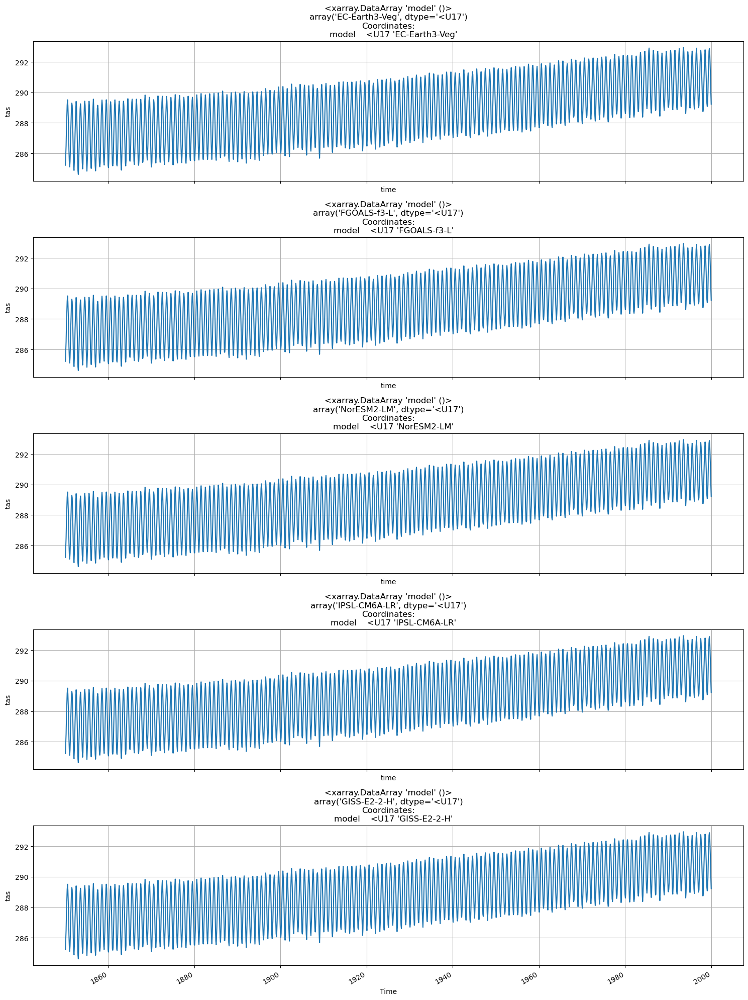

In [102]:
plot_time_series(0,5,15,ds_all_59)

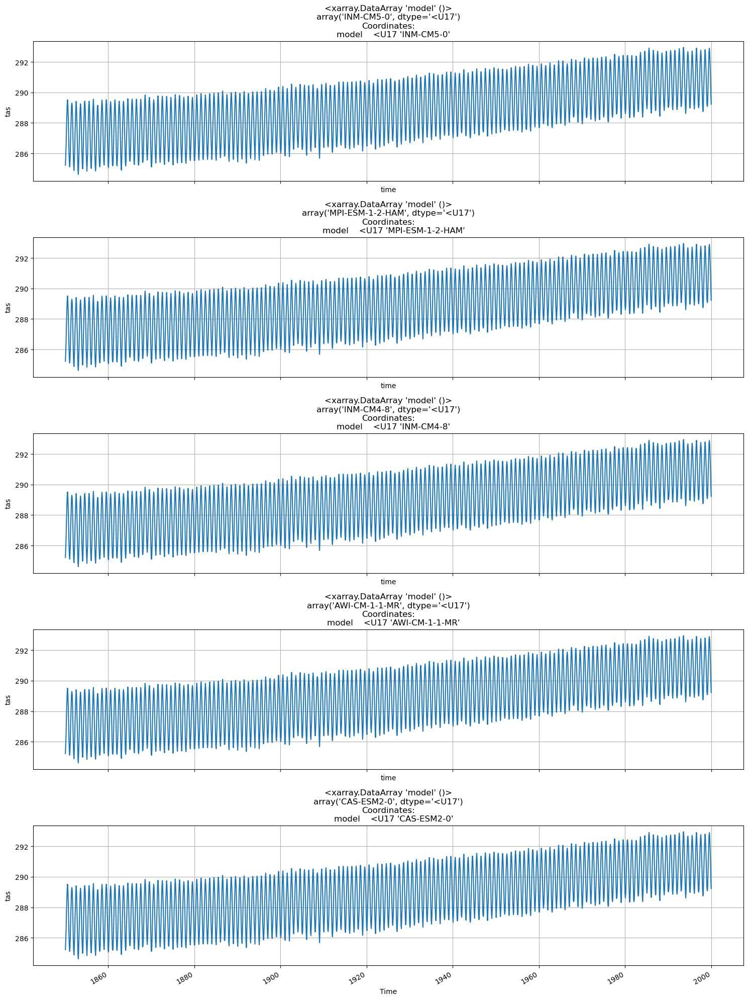

In [103]:
plot_time_series(0,5,20,ds_all_59)

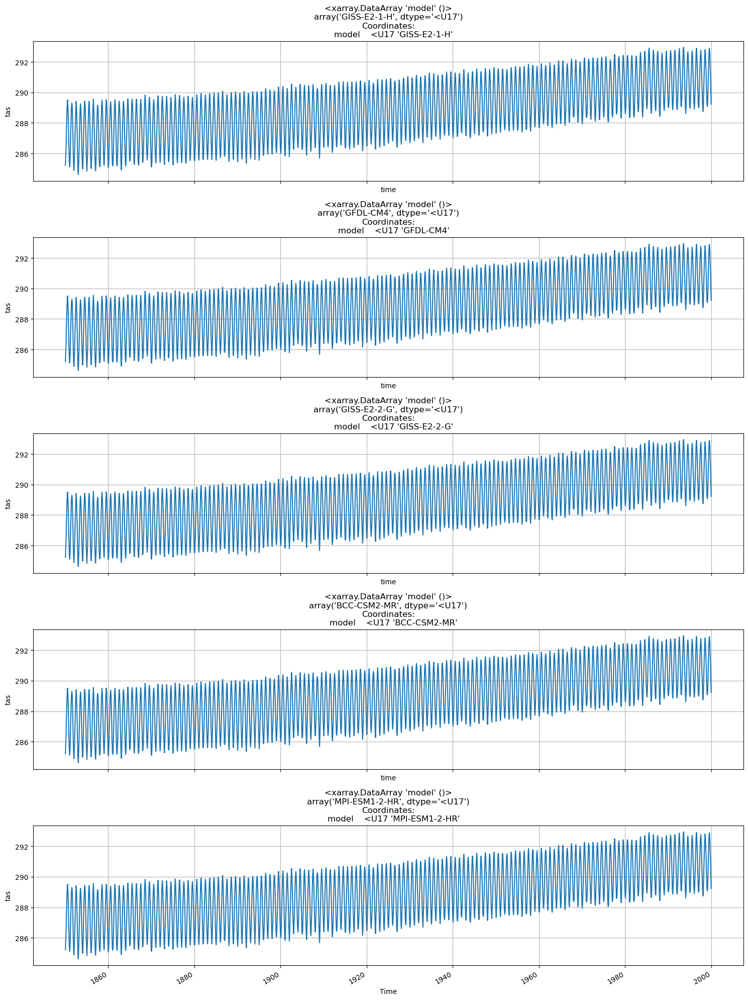

In [104]:
plot_time_series(0,5,25,ds_all_59)

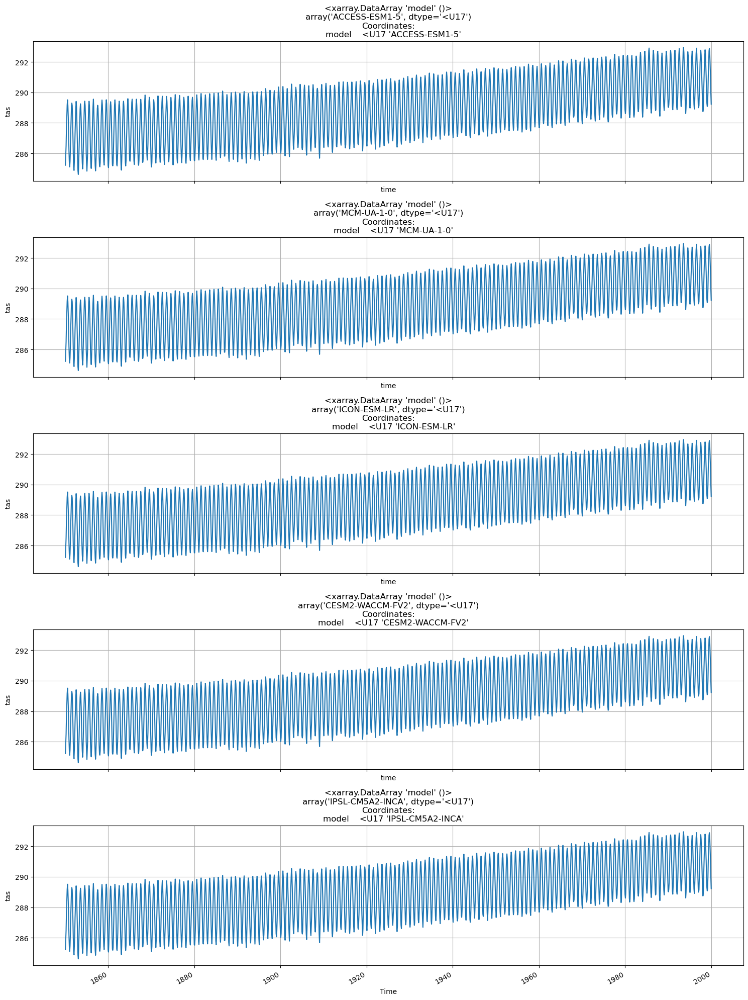

In [105]:
plot_time_series(0,5,30,ds_all_59)

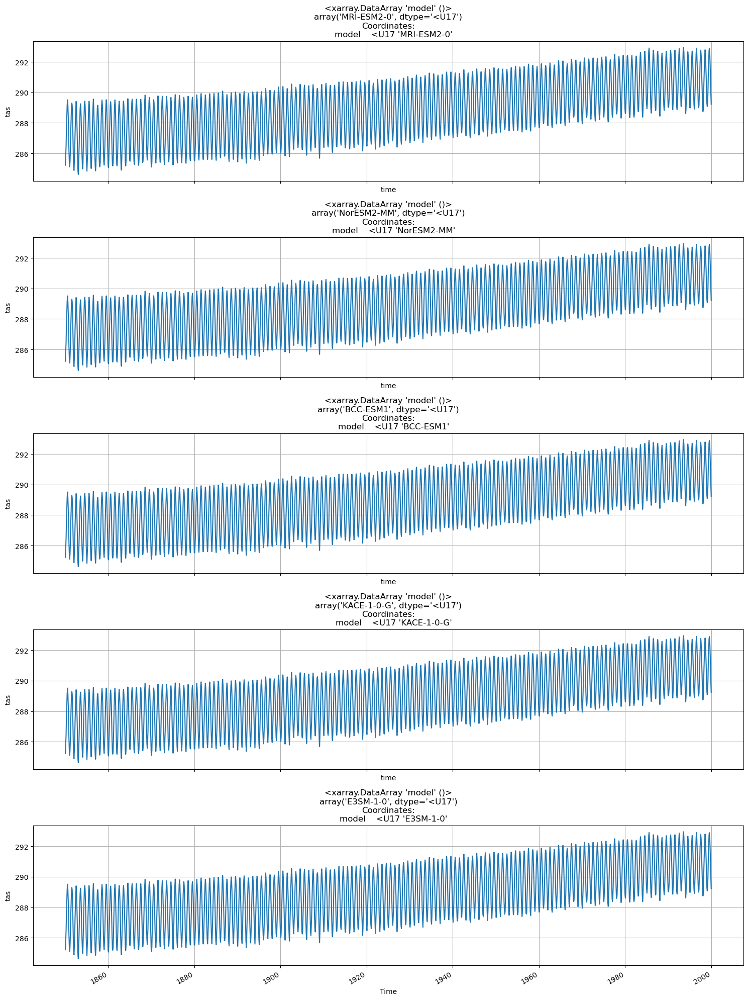

In [106]:
plot_time_series(0,5,35,ds_all_59)

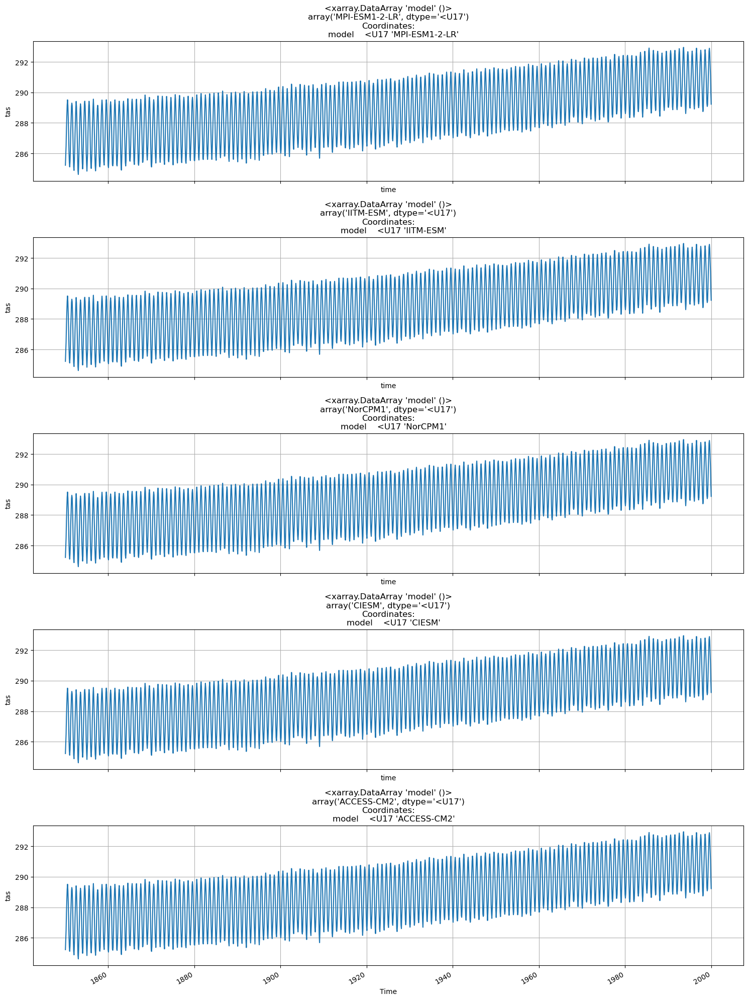

In [107]:
plot_time_series(0,5,40,ds_all_59)

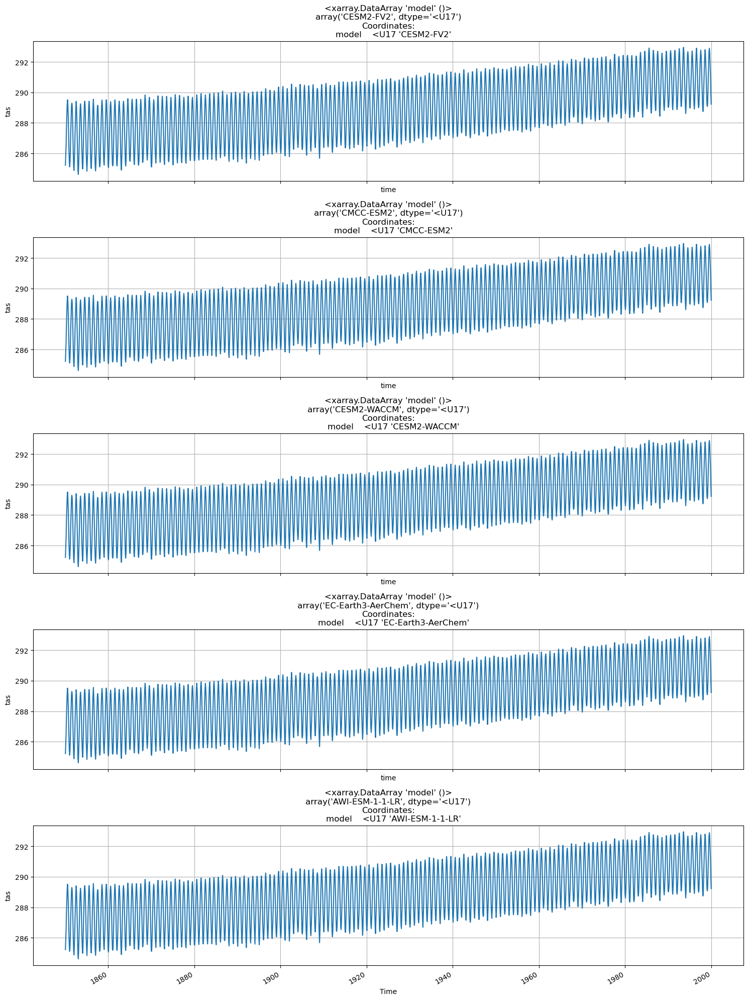

In [108]:
plot_time_series(0,5,45,ds_all_59)

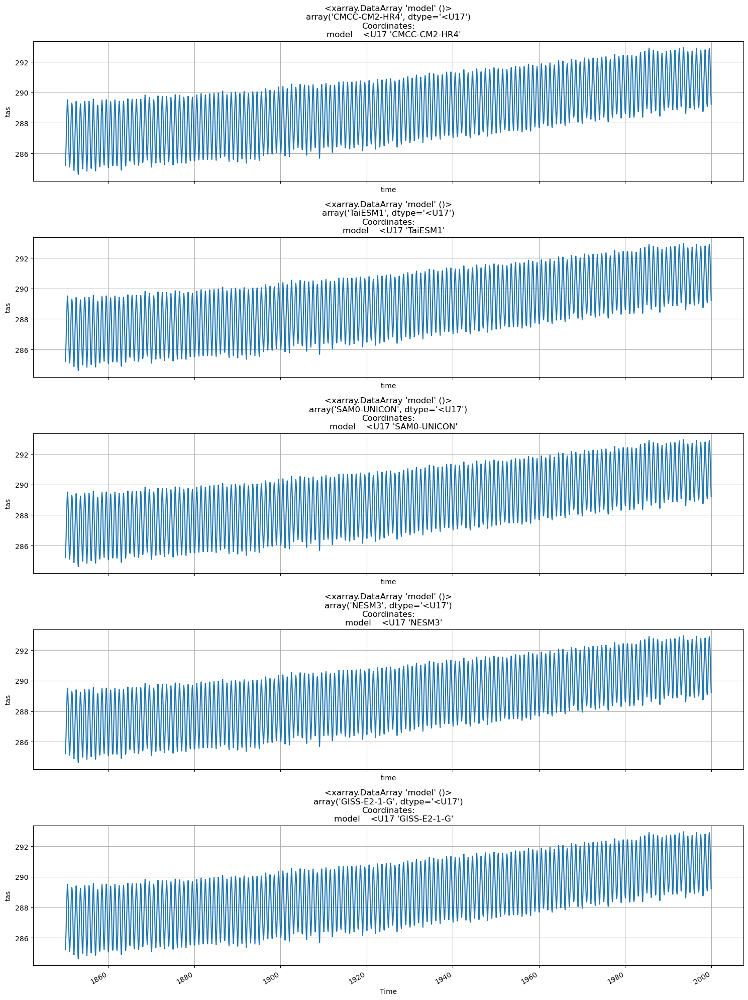

In [109]:
plot_time_series(0,5,50,ds_all_59)

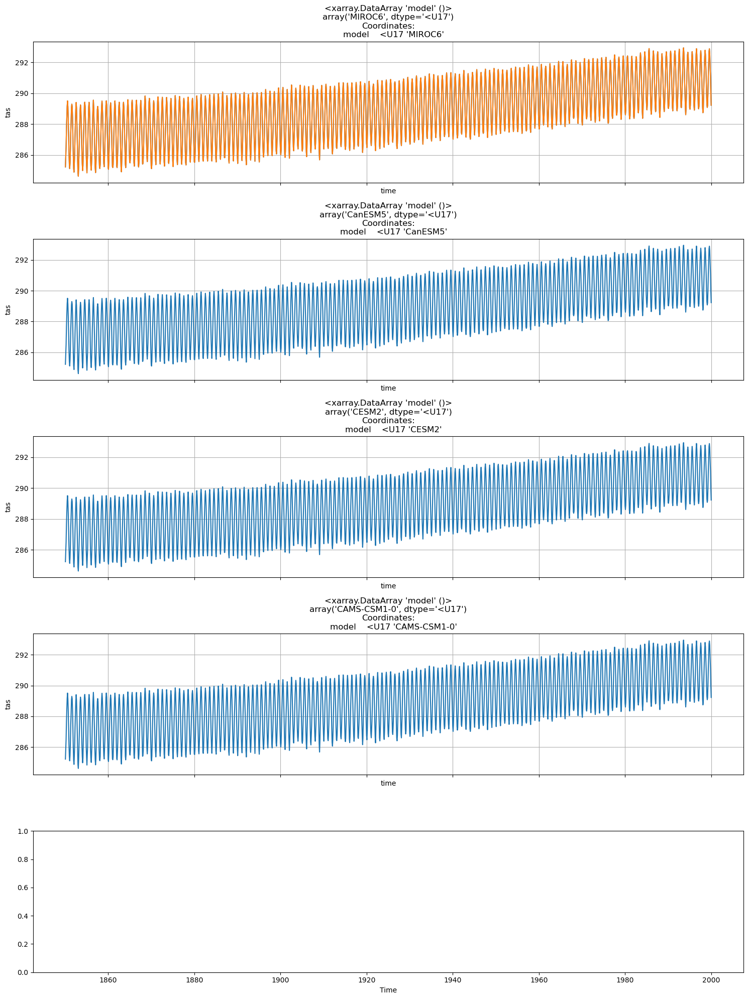

In [110]:
plot_time_series(0,5,55,ds_all_59)

### 1.3 Monthly Anomalies

In [112]:
#remove seasonal cycle
ds_all_models_anom = ds_all_59.tas.groupby('time.month') - ds_all_59.tas.groupby('time.month').mean('time')
#remove baseline: remove avg temp from 1850 to 1900
#ensure that what we are plotting are monthly anomalies relative to an 1850-1900 baseline
ds_all_models_anom = ds_all_models_anom - ds_all_models_anom.sel(time=slice('1850','1900')).mean('time')
ds_all_models_anom

C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\core\indexing.py:1443: PerformanceWarning: Slicing with an out-of-order index is generating 150 times more chunks
  return self.array[key]


<xarray.DataArray 'tas' (model: 59, time: 1800)>
dask.array<sub, shape=(59, 1800), dtype=float64, chunksize=(1, 1), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 1999-12-31
  * model    (model) <U17 'CanESM5-CanOE' 'UKESM1-0-LL' ... 'CAMS-CSM1-0'
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12

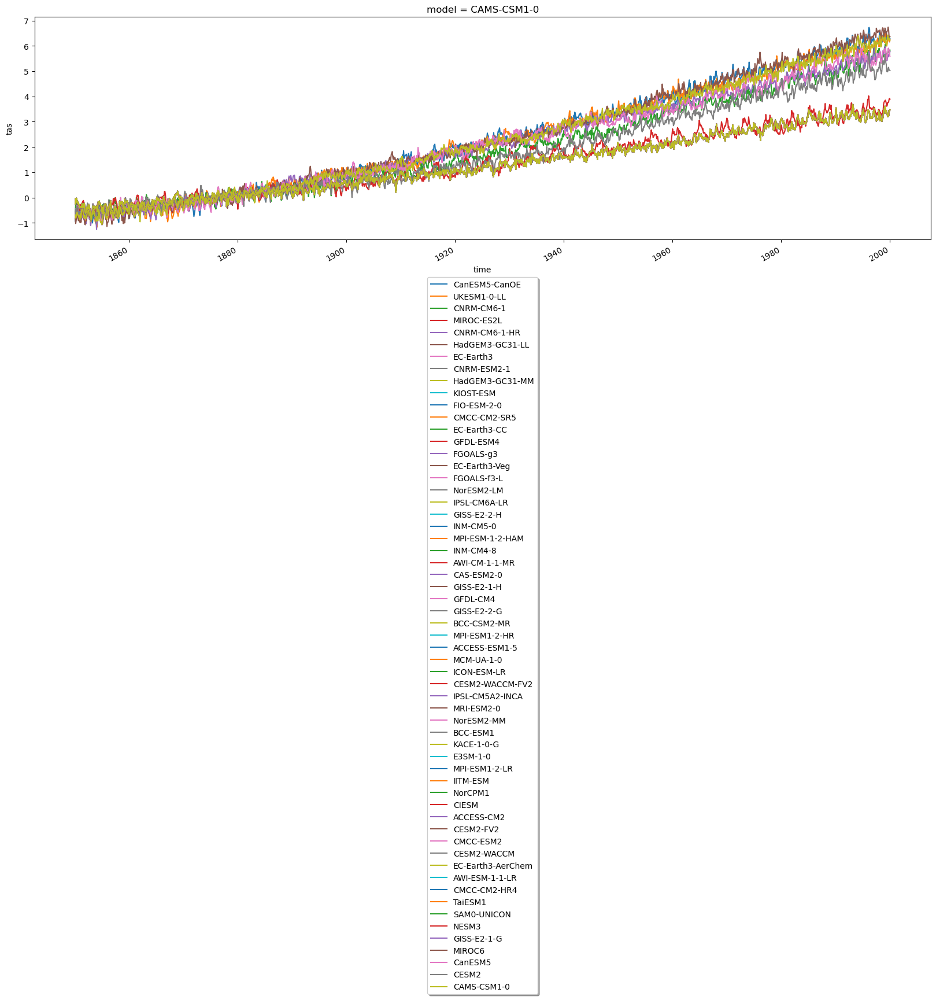

In [116]:
fig, ax = plt.subplots(figsize=(20,5))
# Plot each line separately and collect the lines and labels
handles = []
labels = []
for m in ds_all_models_anom.model.values:
    line = ds_all_models_anom.sel(model=m).plot.line(ax=ax, x='time', hue='model', add_legend=False)
    handles.append(Line2D([], [], color=line[0].get_color(), label=m))  # Create Line2D handle
    labels.append(m)
ax.legend(handles=handles, labels=labels, loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True)

In [117]:
ds_all_59.to_netcdf("processed_tas_global_1pctCO2_data.nc", mode = 'w', format = "NETCDF4", engine = 'netcdf4')